COVID-19 study by graphs and visualizations
Dataset
https://github.com/CSSEGISandData/COVID-19
2019 Novel Coronavirus COVID-19 (2019-nCoV) Data Repository by Johns Hopkins CSSE
This dataset is updated on daily basis by Johns Hopkins CSSE

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Retriving Dataset
df_conf = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_death = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
df_covid = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")
df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])

In [3]:
df_covid.head(5)

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3
0,Australia,2020-06-26 07:33:53,-25.0000,133.0000,7595.0,104.0,6958.0,533.0,29.831459,NaN,NaN,1.369322,36,AUS
1,Austria,2020-06-26 07:33:53,47.5162,14.5501,17477.0,698.0,16320.0,459.0,194.050897,NaN,NaN,3.993820,40,AUT
2,Canada,2020-06-26 07:33:53,60.0010,-95.0010,104463.0,8567.0,66869.0,29027.0,275.950503,NaN,NaN,8.200990,124,CAN
3,China,2020-06-26 07:33:53,30.5928,114.3055,84701.0,4641.0,79572.0,488.0,6.029930,NaN,NaN,5.479274,156,CHN
4,Denmark,2020-06-26 07:33:53,56.2639,9.5018,12836.0,603.0,11660.0,573.0,221.608255,NaN,NaN,4.697725,208,DNK


In [4]:
df_conf.head(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,26310,26874,27532,27878,28424,28833,29157,29481,29640,30175
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,1672,1722,1788,1838,1891,1962,1995,2047,2114,2192
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,11147,11268,11385,11504,11631,11771,11920,12076,12248,12445
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,854,854,855,855,855,855,855,855,855,855
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,148,155,166,172,176,183,186,189,197,212


In [5]:
df_death.head(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,491,504,546,548,569,581,598,618,639,675
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,37,38,39,42,43,44,44,45,47,49
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,788,799,811,825,837,845,852,861,869,878
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,52,52,52,52,52,52,52,52,52,52
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,6,7,8,8,9,9,10,10,10,10


In [6]:
df_table.head(5)

,Country_Region,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered,Incident_Rate,People_Tested,People_Hospitalized,Province_State,FIPS,UID,iso3,Report_Date_String
0,Afghanistan,2020-01-22,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/22
1,Afghanistan,2020-01-23,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/23
2,Afghanistan,2020-01-24,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/24
3,Afghanistan,2020-01-25,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/25
4,Afghanistan,2020-01-26,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/26


In [4]:
#First rename columns
df_conf = df_conf.rename(columns={"Province/State":"state","Country/Region": "country"})
df_death = df_death.rename(columns={"Province/State":"state","Country/Region": "country"})
df_covid = df_covid.rename(columns={"Country_Region": "country"})
df_table = df_table.rename(columns={"Country_Region": "country"})

Now we start to observe the data a little closely and organise them first before we begin exploring it. 
First we check the count of each table. Can we join each on country? Do they have the same number of rows?

In [22]:
df_covid.count()['country']

188

In [23]:
df_conf.count()['country']

266

In [24]:
df_death.count()['country']

266

In [15]:
df_covid['country'].nunique()

188

In [16]:
df_conf['country'].nunique() #This means this set has some repeated countries

188

In [5]:
df_cnt_country = df_conf.groupby('country').count()['Lat']
df_cnt_country[df_cnt_country > 1]
#These are the countries that have 

country
Australia          8
Canada            14
China             33
Denmark            3
France            11
Netherlands        5
United Kingdom    11
Name: Lat, dtype: int64

In [32]:
df_conf[df_conf['country'] == 'Australia']

,state,country,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20
8,Australian Capital Territory,Australia,-35.4735,149.0124,0,0,0,0,0,0,...,108,108,108,108,108,108,108,108,108,108
9,New South Wales,Australia,-33.8688,151.2093,0,0,0,0,3,4,...,3135,3137,3143,3144,3149,3151,3150,3159,3162,3168
10,Northern Territory,Australia,-12.4634,130.8456,0,0,0,0,0,0,...,29,29,29,29,29,29,29,29,29,29
11,Queensland,Australia,-28.0167,153.4000,0,0,0,0,0,0,...,1066,1066,1066,1066,1066,1066,1066,1066,1066,1067
12,South Australia,Australia,-34.9285,138.6007,0,0,0,0,0,0,...,440,440,440,440,440,440,440,440,440,440
13,Tasmania,Australia,-41.4545,145.9707,0,0,0,0,0,0,...,228,228,228,228,228,228,228,228,228,228
14,Victoria,Australia,-37.8136,144.9631,0,0,0,0,1,1,...,1762,1780,1792,1792,1836,1847,1864,1884,1917,1947
15,Western Australia,Australia,-31.9505,115.8605,0,0,0,0,0,0,...,602,603,603,604,605,605,607,607,608,608


In [6]:
#we can combine this data for all the above cases so we have just countrywise data to deal with and no states
df_conf = df_conf.drop(['Lat','Long','state'],axis = 1).groupby('country').sum()
df_death = df_death.drop(['Lat','Long','state'],axis = 1).groupby('country').sum()


In [7]:
df_conf.reset_index(inplace = True)
df_death.reset_index(inplace = True)

In [8]:
#Adjust some data

df_conf.loc[df_conf['country'] == 'Korea, South', 'country'] = 'South Korea'
df_death.loc[df_death['country'] == 'Korea, South', 'country'] = 'South Korea'
df_covid.loc[df_covid['country'] == "Korea, South", 'country'] = "South Korea"
df_table.loc[df_table['country'] == "Korea, South", 'country'] = "South Korea"

df_conf.loc[df_conf['country'] == 'Taiwan*', 'country'] = 'Taiwan'
df_death.loc[df_death['country'] == 'Taiwan*', 'country'] = 'Taiwan'
df_covid.loc[df_covid['country'] == 'Taiwan*', 'country'] = 'Taiwan'
df_table.loc[df_table['country'] == 'Taiwan*', 'country'] = 'Taiwan'

df_conf.loc[df_conf['country'] == 'Congo (Kinshasa)', 'country'] = 'Democratic Republic of the Congo'
df_death.loc[df_death['country'] == 'Congo (Kinshasa)', 'country'] = 'Democratic Republic of the Congo'
df_covid.loc[df_covid['country'] == "Congo (Kinshasa)", 'country'] = "Democratic Republic of the Congo"
df_table.loc[df_table['country'] == "Congo (Kinshasa)", 'country'] = "Democratic Republic of the Congo"

df_conf.loc[df_conf['country'] == 'Congo (Brazzaville)', 'country'] = 'Republic of the Congo'
df_death.loc[df_death['country'] == 'Congo (Brazzaville)', 'country'] = 'Republic of the Congo'
df_covid.loc[df_covid['country'] == "Congo (Brazzaville)", 'country'] = "Republic of the Congo"
df_table.loc[df_table['country'] == "Congo (Brazzaville)", 'country'] = "Republic of the Congo"

df_conf.loc[df_conf['country'] == 'Bahamas, The', 'country'] = 'Bahamas'
df_death.loc[df_death['country'] == 'Bahamas, The','country'] = 'Bahamas'
df_covid.loc[df_covid['country'] == "Bahamas, The",'country'] = "Bahamas"
df_table.loc[df_table['country'] == "Bahamas, The", 'country'] = "Bahamas"

df_conf.loc[df_conf['country'] == 'Gambia, The', 'country'] = 'Gambia'
df_death.loc[df_death['country'] == 'Gambia, The', 'country'] = 'Gambia'
df_covid.loc[df_covid['country'] == "Gambia, The", 'country'] = "Gambia"
df_table.loc[df_table['country'] == "Gambia", 'country'] = "Gambia"

In [9]:
#Replace null value with 0 
df_conf.fillna(0)
df_death.fillna(0)

,country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20
0,Afghanistan,0,0,0,0,0,0,0,0,0,...,504,546,548,569,581,598,618,639,675,683
1,Albania,0,0,0,0,0,0,0,0,0,...,38,39,42,43,44,44,45,47,49,51
2,Algeria,0,0,0,0,0,0,0,0,0,...,799,811,825,837,845,852,861,869,878,885
3,Andorra,0,0,0,0,0,0,0,0,0,...,52,52,52,52,52,52,52,52,52,52
4,Angola,0,0,0,0,0,0,0,0,0,...,7,8,8,9,9,10,10,10,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,West Bank and Gaza,0,0,0,0,0,0,0,0,0,...,3,3,3,3,3,3,3,3,3,3
184,Western Sahara,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
185,Yemen,0,0,0,0,0,0,0,0,0,...,244,248,251,254,256,257,261,274,288,293
186,Zambia,0,0,0,0,0,0,0,0,0,...,11,11,11,11,11,11,18,18,18,21


GLobal Reported Cases Till date

In [51]:
df_covid[['Confirmed','Deaths','Recovered','Active']].sum()

Confirmed    9612250.0
Deaths        489372.0
Recovered    4840665.0
Active       4206271.0
dtype: float64

In [40]:
df_covid[['country','Confirmed','Deaths','Recovered','Active']].style.background_gradient(cmap='viridis')

C:\Users\siddhartha_bhadra\Documents\ananya\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


,country,Confirmed,Deaths,Recovered,Active
0,Australia,7641.000000,104.000000,6979.000000,558.000000
1,Austria,17580.000000,700.000000,16371.000000,509.000000
2,Canada,104652.000000,8568.000000,67248.000000,28837.000000
3,China,84726.000000,4641.000000,79584.000000,501.000000
4,Denmark,12875.000000,604.000000,11708.000000,563.000000
5,Finland,7198.000000,328.000000,6600.000000,270.000000
6,France,199473.000000,29781.000000,75773.000000,93919.000000
7,Germany,194458.000000,8968.000000,177434.000000,8056.000000
8,Iceland,1836.000000,10.000000,1814.000000,12.000000
9,Ireland,25414.000000,1730.000000,23364.000000,320.000000


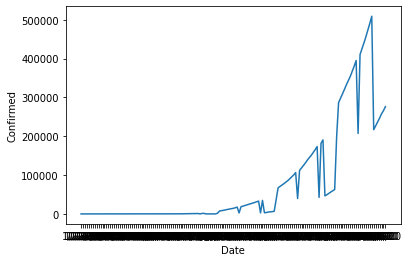

In [10]:
#Analyse India's statistics on this pandemic
df_conf_india = df_conf[df_conf['country'] == 'India'].drop(['country'],axis = 1).transpose()
df_conf_india.reset_index(inplace = True)
df_death_india = df_death[df_death['country'] == 'India'].drop(['country'],axis = 1).transpose()
df_death_india.reset_index(inplace = True)
df_india = pd.merge(df_conf_india, df_death_india, on = 'index',how='inner')
df_india = df_india.rename(columns={'79_x': 'Confirmed','79_y':'Death','index':'Date'})
sns.lineplot(x='Date',y='Confirmed',data=df_india)

Text(0.5, 1.0, 'India')

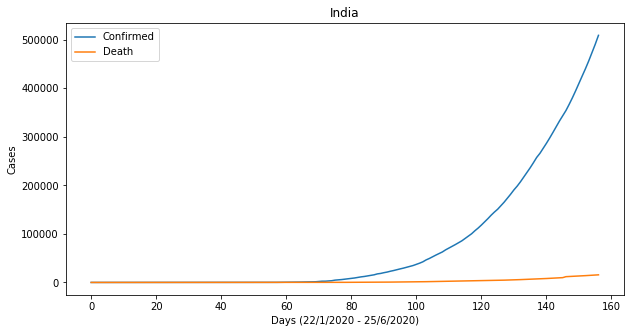

In [11]:
df_india.plot(figsize=(10,5))
plt.xlabel('Days (22/1/2020 - 25/6/2020)')
plt.ylabel('Cases')
plt.title('India')
#sns.lineplot(data = df_india.drop(['Date'],axis = 1)) #Just another method to do the same

Better we can do side by side comparison of all countries . Hence, created the below dataframe 

In [12]:
df_conf_all = df_conf.transpose()
df_conf_all.reset_index(inplace = True)
df_conf_all.reset_index(inplace = True)
df_conf_all.columns = df_conf_all.iloc[0]
df_conf_all.drop([0],inplace = True)
df_conf_all = df_conf_all.rename(columns = {0:'Days','country':'Date'})
df_conf_all

,Days,Date,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
1,1,1/22/20,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,1/23/20,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
3,3,1/24/20,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
4,4,1/25/20,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
5,5,1/26/20,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,153,6/22/20,29157,1995,11920,855,186,26,44931,20588,...,306761,882,6461,4048,349,1001,10,967,1430,512
154,154,6/23/20,29481,2047,12076,855,189,26,47203,21006,...,307682,885,6662,4187,349,1169,10,992,1477,525
155,155,6/24/20,29640,2114,12248,855,197,26,49851,21717,...,308337,902,6990,4366,352,1328,10,1015,1489,530
156,156,6/25/20,30175,2192,12445,855,212,65,52457,22488,...,309455,907,7177,4563,352,1382,10,1076,1497,551


In [35]:
df_death_all = df_death.transpose()
df_death_all.reset_index(inplace = True)
df_death_all.reset_index(inplace = True)
df_death_all.columns = df_death_all.iloc[0]
df_death_all.drop([0],inplace = True)
df_death_all = df_death_all.rename(columns = {0:'Days','country':'Date'})
df_death_all

,Days,Date,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
1,1,1/22/20,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,1/23/20,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,1/24/20,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,1/25/20,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,5,1/26/20,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,153,6/22/20,598,44,852,52,10,3,1043,360,...,42731,25,19,35,0,3,1,257,11,6
154,154,6/23/20,618,45,861,52,10,3,1078,372,...,43011,25,19,35,0,3,1,261,18,6
155,155,6/24/20,639,47,869,52,10,3,1116,386,...,43165,26,19,38,0,3,1,274,18,6
156,156,6/25/20,675,49,878,52,10,3,1150,397,...,43314,26,20,39,0,3,1,288,18,6


# Comparison of cases among countries (Linearly)

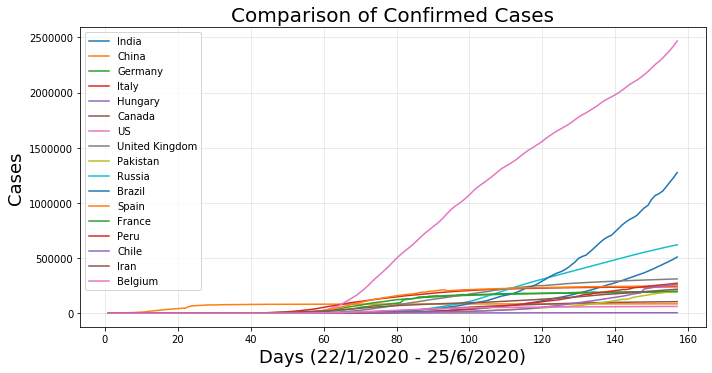

In [56]:
df_conf_all[['India','China','Germany','Italy','Hungary','Canada','US','United Kingdom','Pakistan','Russia','Brazil','Spain','France','Peru','Chile','Iran','Belgium']].plot(figsize=(10,5))
plt.legend()
plt.xlabel('Days (22/1/2020 - 25/6/2020)',fontsize=18)
plt.ylabel('Cases',fontsize=18)
plt.tight_layout()
plt.title("Comparison of Confirmed Cases",fontsize=20)
plt.grid(alpha=0.3)


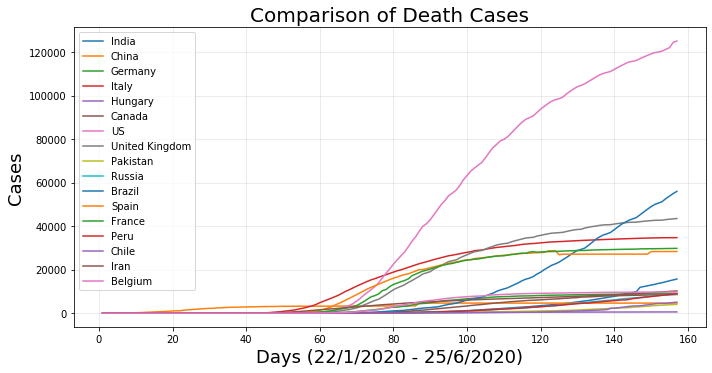

In [58]:
df_death_all[['India','China','Germany','Italy','Hungary','Canada','US','United Kingdom','Pakistan','Russia','Brazil','Spain','France','Peru','Chile','Iran','Belgium']].plot(figsize=(10,5))
plt.legend()
plt.xlabel('Days (22/1/2020 - 25/6/2020)',fontsize=18)
plt.ylabel('Cases',fontsize=18)
plt.tight_layout()
plt.title("Comparison of Death Cases",fontsize=20)
plt.grid(alpha=0.3)


# Pie for all active cases worldwide

In [31]:
plt.figure(figsize = (160,80))
plt.pie(df_covid['Active'])
plt.legend(df_covid['country'], loc='best', fontsize=60 ,ncol = 3)
plt.axis('equal')
plt.show()

# Pie for all deaths worldwide

In [36]:
plt.figure(figsize = (160,80))
plt.pie(df_covid['Deaths'])
plt.legend(df_covid['country'], loc='best', fontsize=60 ,ncol = 3)
plt.axis('equal')
plt.show()

# Pie for all confirmed cases worldwide

In [37]:
plt.figure(figsize = (160,80))
plt.pie(df_covid['Confirmed'])
plt.legend(df_covid['country'], loc='best', fontsize=60 ,ncol = 3)
plt.axis('equal')
plt.show()

# Top 10 countries (Confirmed Cases and Deaths)

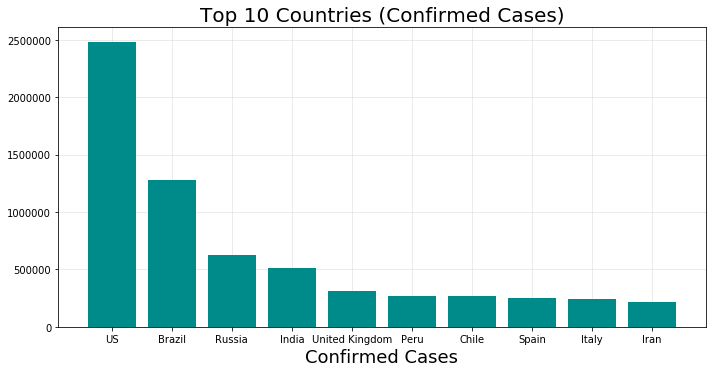

In [52]:
f = plt.figure(figsize=(10,5))
plt.axes(axisbelow=True)
plt.bar(df_covid.nlargest(10, 'Confirmed')['country'],df_covid.nlargest(10, 'Confirmed')['Confirmed'],color="darkcyan")
plt.xlabel("Confirmed Cases",fontsize=18)
plt.tight_layout()
plt.title("Top 10 Countries (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)

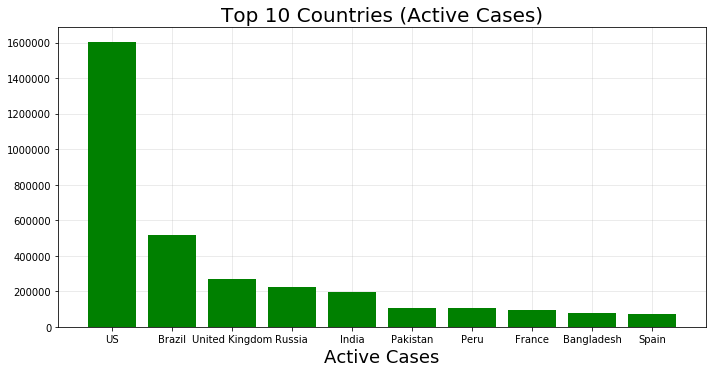

In [53]:
f = plt.figure(figsize=(10,5))
plt.axes(axisbelow=True)
plt.bar(df_covid.nlargest(10, 'Active')['country'],df_covid.nlargest(10, 'Active')['Active'],color="green")
plt.xlabel("Active Cases",fontsize=18)
plt.tight_layout()
plt.title("Top 10 Countries (Active Cases)",fontsize=20)
plt.grid(alpha=0.3)

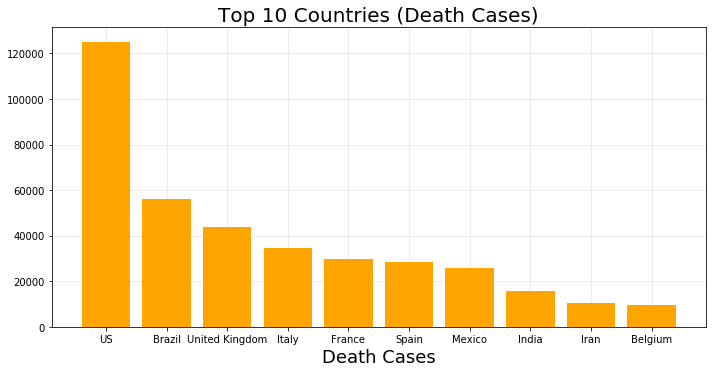

In [54]:
f = plt.figure(figsize=(10,5))
plt.axes(axisbelow=True)
plt.bar(df_covid.nlargest(10, 'Deaths')['country'],df_covid.nlargest(10, 'Deaths')['Deaths'],color="orange")
plt.xlabel("Death Cases",fontsize=18)
plt.tight_layout()
plt.title("Top 10 Countries (Death Cases)",fontsize=20)
plt.grid(alpha=0.3)

# Daily Case trends of different countries

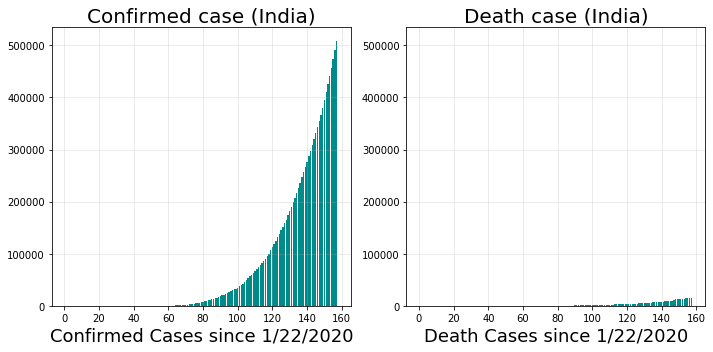

In [73]:
f = plt.figure(figsize=(10,5))
ax1 =plt.subplot(1,2,1)
plt.bar(df_conf_all['Days'],df_conf_all['India'],color="darkcyan")
plt.xlabel("Confirmed Cases since 1/22/2020",fontsize=18)
plt.tight_layout()
plt.title("Confirmed case (India)",fontsize=20)
plt.grid(alpha=0.3)

ax2 = plt.subplot(1,2,2,sharey=ax1)
plt.bar(df_death_all['Days'],df_death_all['India'],color="darkcyan")
plt.xlabel("Death Cases since 1/22/2020",fontsize=18)
plt.tight_layout()
plt.title("Death case (India)",fontsize=20)
plt.grid(alpha=0.3)


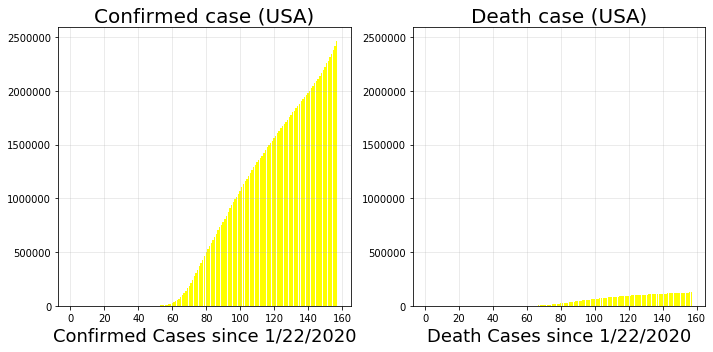

In [76]:
f = plt.figure(figsize=(10,5))
ax1 =plt.subplot(1,2,1)
plt.bar(df_conf_all['Days'],df_conf_all['US'],color="yellow")
plt.xlabel("Confirmed Cases since 1/22/2020",fontsize=18)
plt.tight_layout()
plt.title("Confirmed case (USA)",fontsize=20)
plt.grid(alpha=0.3)

ax2 = plt.subplot(1,2,2,sharey=ax1)
plt.bar(df_death_all['Days'],df_death_all['US'],color="yellow")
plt.xlabel("Death Cases since 1/22/2020",fontsize=18)
plt.tight_layout()
plt.title("Death case (USA)",fontsize=20)
plt.grid(alpha=0.3)

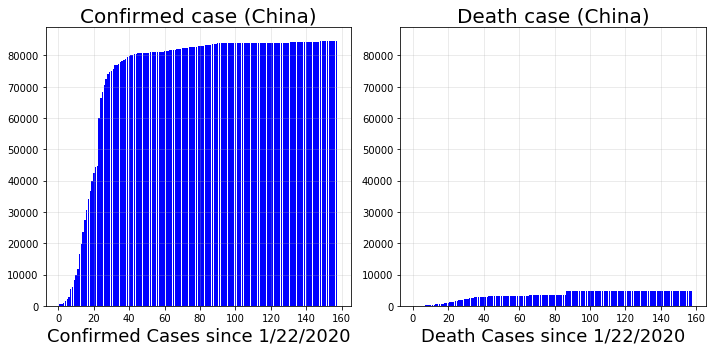

In [77]:
f = plt.figure(figsize=(10,5))
ax1 =plt.subplot(1,2,1)
plt.bar(df_conf_all['Days'],df_conf_all['China'],color="blue")
plt.xlabel("Confirmed Cases since 1/22/2020",fontsize=18)
plt.tight_layout()
plt.title("Confirmed case (China)",fontsize=20)
plt.grid(alpha=0.3)

ax2 = plt.subplot(1,2,2,sharey=ax1)
plt.bar(df_death_all['Days'],df_death_all['China'],color="blue")
plt.xlabel("Death Cases since 1/22/2020",fontsize=18)
plt.tight_layout()
plt.title("Death case (China)",fontsize=20)
plt.grid(alpha=0.3)

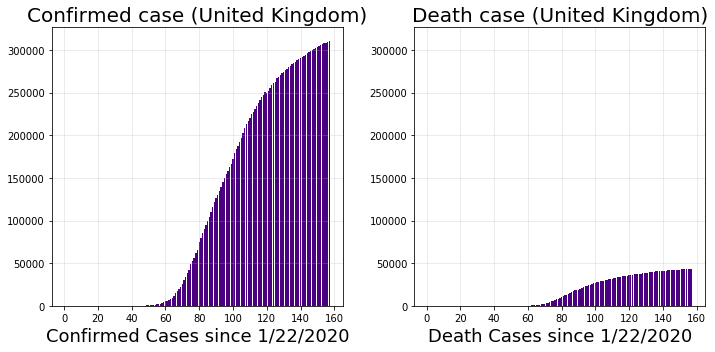

In [78]:
f = plt.figure(figsize=(10,5))
ax1 =plt.subplot(1,2,1)
plt.bar(df_conf_all['Days'],df_conf_all['United Kingdom'],color="indigo")
plt.xlabel("Confirmed Cases since 1/22/2020",fontsize=18)
plt.tight_layout()
plt.title("Confirmed case (United Kingdom)",fontsize=20)
plt.grid(alpha=0.3)

ax2 = plt.subplot(1,2,2,sharey=ax1)
plt.bar(df_death_all['Days'],df_death_all['United Kingdom'],color="indigo")
plt.xlabel("Death Cases since 1/22/2020",fontsize=18)
plt.tight_layout()
plt.title("Death case (United Kingdom)",fontsize=20)
plt.grid(alpha=0.3)